# Imports

In [1]:
import numpy as np
import sympy as sp
from numba import njit

Mis funciones definidas en `/code/src/`

In [2]:
import sys
import os

# Navigate up to the 'code' directory, then into 'src'
sys.path.append(os.path.abspath('../src'))

# Import the functions
from dynamics import generate_orbit, generate_escape_time_fractal, generate_fatou_basins, generate_fatou_basins_and_times, make_generate_orbit_jitted, make_generate_escape_time_fractal_jitted, make_generate_fatou_basins_jitted, make_generate_fatou_basins_and_times_jitted
from utils import DynamicsPlotter

# Generate orbit example

## Non optimized, raw Python

In [3]:
# 1. Define your function
def R(z):
    return z**2 - 1 # Example rational function

In [4]:
# 2. Generate the orbit
z0 = 0.5 * np.exp(2.0j*np.pi / 6.0)
orbit = generate_orbit(z0, R, max_iter=100)

C:\Users\abald\AppData\Local\Temp\ipykernel_22588\2334059751.py:3: RuntimeWarning: overflow encountered in scalar power
  return z**2 - 1 # Example rational function
C:\Users\abald\AppData\Local\Temp\ipykernel_22588\2334059751.py:3: RuntimeWarning: invalid value encountered in scalar power
  return z**2 - 1 # Example rational function


(<Figure size 600x600 with 1 Axes>, <Axes: title={'center': 'Orbit'}>)

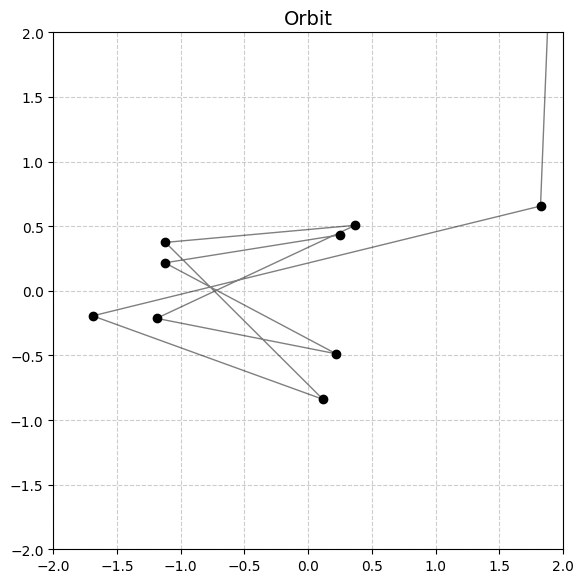

In [5]:
# 3. Plot consistently
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

plotter.plot_orbit(orbit)

## Optimized, njit

In [6]:
# 1. Define your jitted function
@njit
def R_njit(z):
    return z**2 - 1  # Example rational function

# 2. Create the optimized generator
generate_orbit_jitted = make_generate_orbit_jitted(R_njit)

In [7]:
# 3. Use the created function for generating the Fatou basins (it will compile on the first run, then fly!)
z0 = 0.5 * np.exp(2.0j*np.pi / 6.0)
orbit = generate_orbit_jitted(z0, max_iter=100)

(<Figure size 600x600 with 1 Axes>, <Axes: title={'center': 'Orbit'}>)

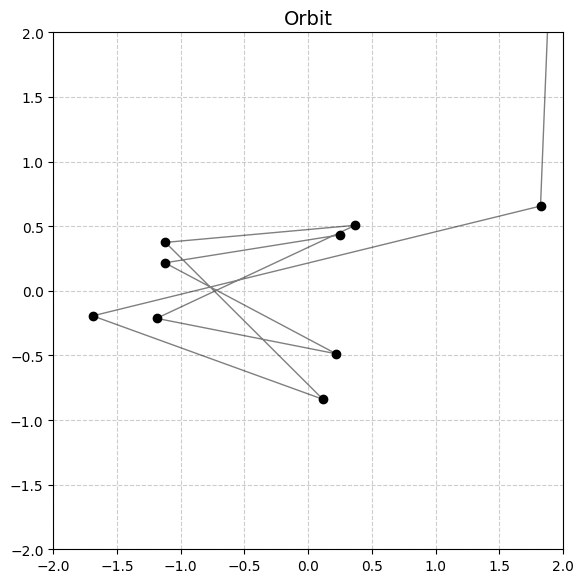

In [8]:
# 4. Plot consistently
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

plotter.plot_orbit(orbit)

## Plotting options

<Axes: title={'center': 'Orbit'}>

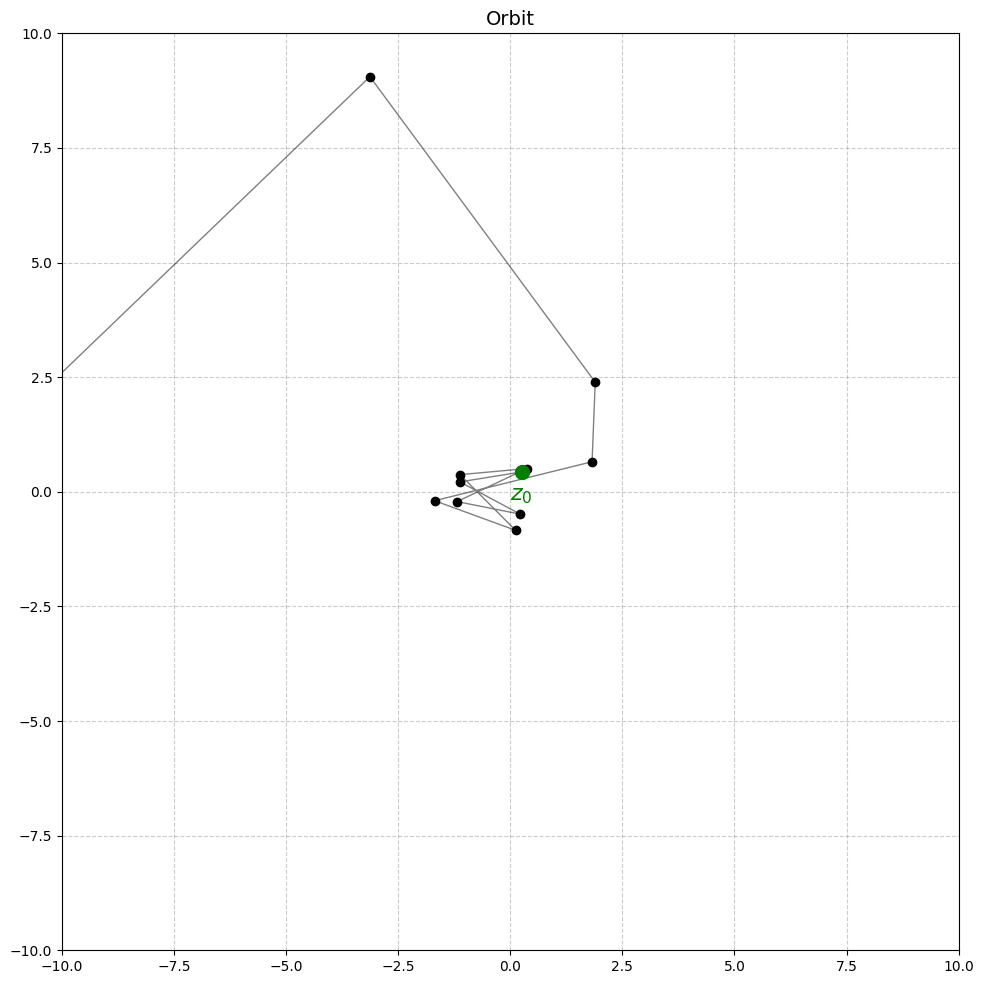

In [9]:
plotter = DynamicsPlotter(-10.0, 10.0, -10.0, 10.0, figsize=(10, 10), use_latex=False)

fig, ax = plotter.plot_orbit(orbit, connect_lines=True, marker='o', color='black', title="Orbit")
plotter.add_points(ax, [z0], label="$z_0$", marker='o', color='green', s=100, zorder=10)#, **kwargs)

# Generate escape time fractal example

## Non optimized, raw Python

In [10]:
# 1. Define your function
def R(z):
    return z**2 - 1 # Example rational function

In [11]:
# 2. Generate the ecape time fractal
scape_times = generate_escape_time_fractal(-2.0, 2.0, -2.0, 2.0, 1000, 1000, R, max_iter=100, infinity_threshold=2.0)

(<Figure size 600x600 with 1 Axes>,
 <Axes: title={'center': 'Julia Set (Escape Boundary)'}>)

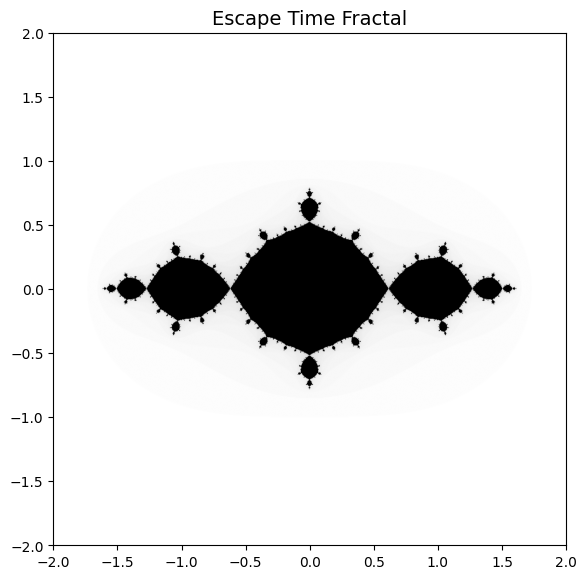

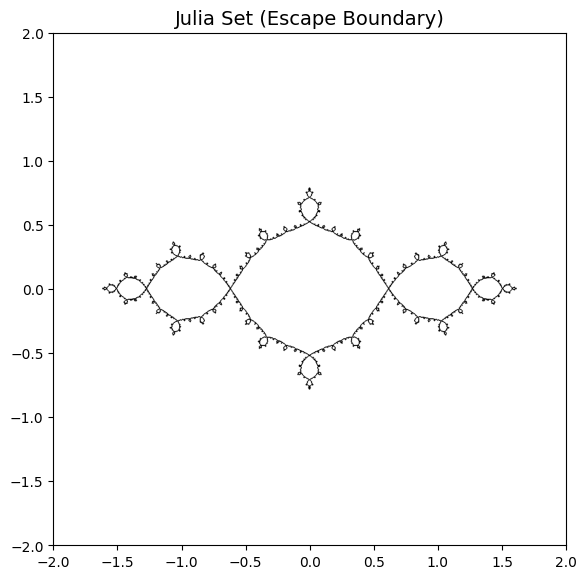

In [12]:
# 3. Plot consistently
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

# Plot 1: The escape time fractal
plotter.plot_escape_time_fractal(scape_times)

# Plot 2: Just the Julia set (the delicate boundary curve)
plotter.plot_julia_set_from_escape_times(scape_times, max_iter=100)

## Optimized, njit

In [13]:
# 1. Define your jitted function
@njit
def R_njit(z):
    return z**2 - 1  # Example rational function

# 2. Create the optimized generator
generate_escape_time_fractal_jitted = make_generate_escape_time_fractal_jitted(R_njit)

In [14]:
# 3. Use the created function for generating the Fatou basins (it will compile on the first run, then fly!)
escape_times = generate_escape_time_fractal_jitted(-2.0, 2.0, -2.0, 2.0, 1000, 1000, max_iter=100, infinity_threshold=2.0)

(<Figure size 600x600 with 1 Axes>,
 <Axes: title={'center': 'Julia Set (Escape Boundary)'}>)

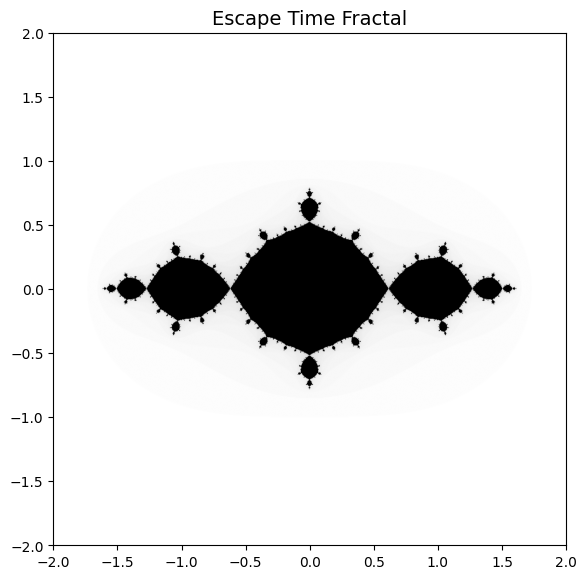

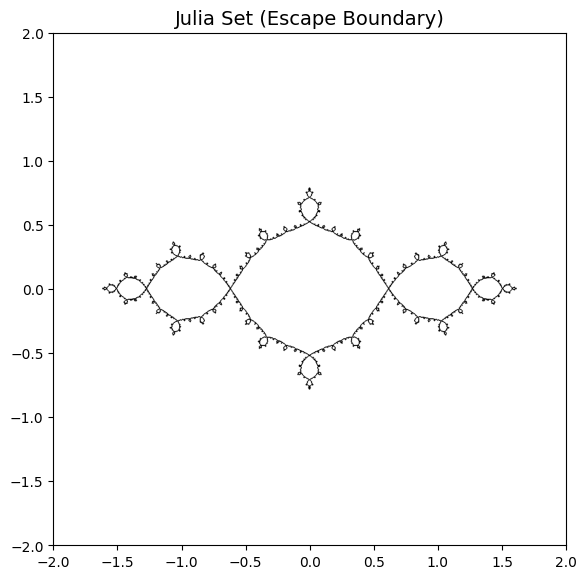

In [15]:
# 4. Plot consistently
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

# Plot 1: The escape time fractal
plotter.plot_escape_time_fractal(escape_times)

# Plot 2: Just the Julia set (the delicate boundary curve)
plotter.plot_julia_set_from_escape_times(escape_times, max_iter=100)

## Plotting options

(<Figure size 1000x1000 with 1 Axes>,
 <Axes: title={'center': 'Julia Set (Escape Boundary)'}>)

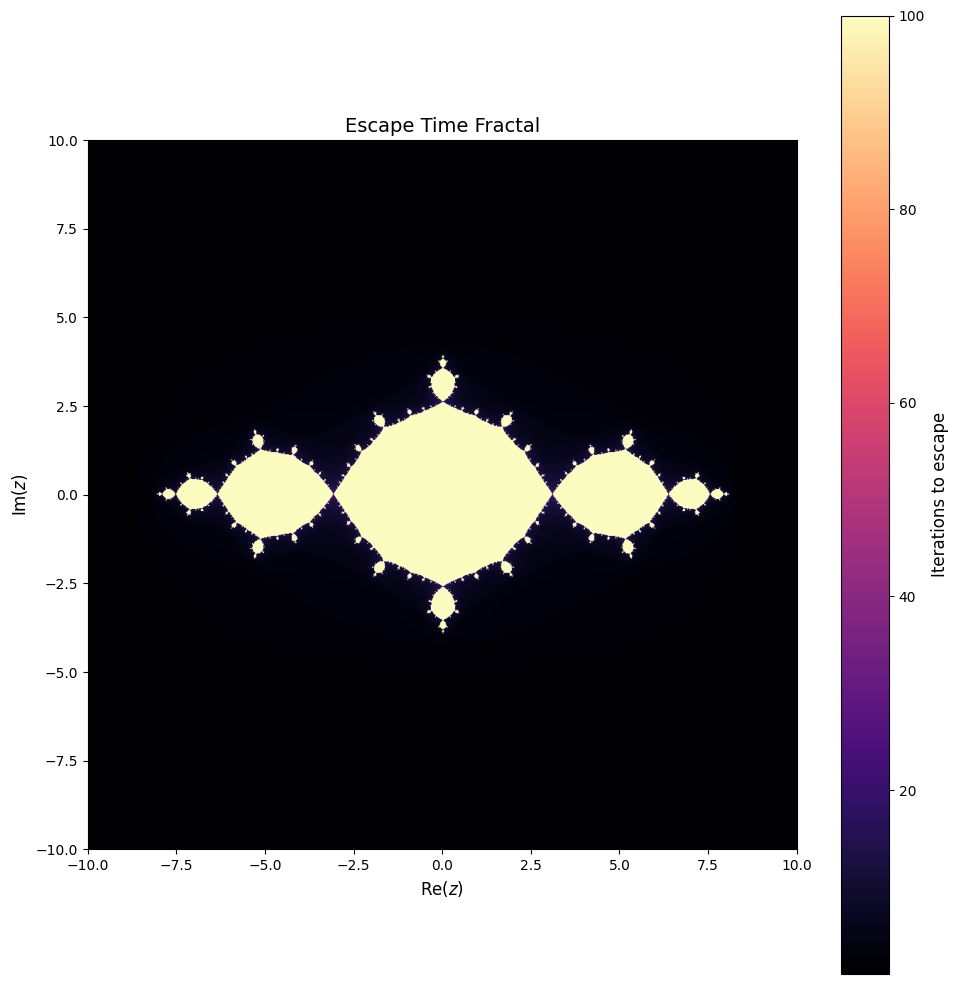

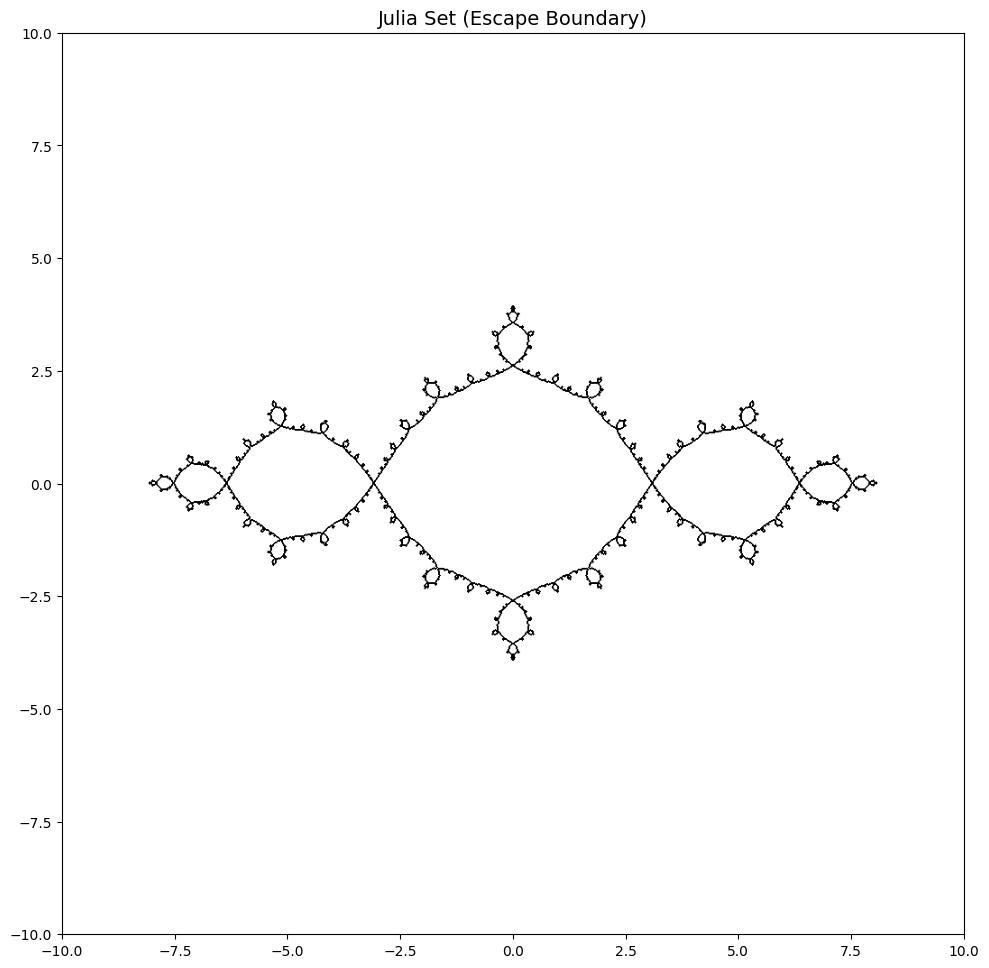

In [16]:
plotter = DynamicsPlotter(-10.0, 10.0, -10.0, 10.0, figsize=(10, 10), use_latex=False)

# Plot 1: The escape time fractal
plotter.plot_escape_time_fractal(escape_times, cmap='magma', title="Escape Time Fractal", show_axis=True, show_axis_labels=True, show_colorbar=True, colorbar_label="Iterations to escape")

# Plot 2: Just the Julia set (the delicate boundary curve)
plotter.plot_julia_set_from_escape_times(escape_times, max_iter=100, color='black', title="Julia Set (Escape Boundary)", show_axis=True, show_axis_labels=False)

# Generate Fatou basins example

## Non optimized, raw Python

In [17]:
# 1. Define your function
def R(z):
    return z**2 - 1 # Example rational function

In [18]:
# 2. Generate the Fatou basins
attractors = np.array([0, -1], dtype=np.complex128)
basins = generate_fatou_basins(-2.0, 2.0, -2.0, 2.0, 1000, 1000, R, attractors, max_iter=100, tolerance=1e-6)

(<Figure size 600x600 with 1 Axes>,
 <Axes: title={'center': 'Julia Set (Basin Boundaries)'}>)

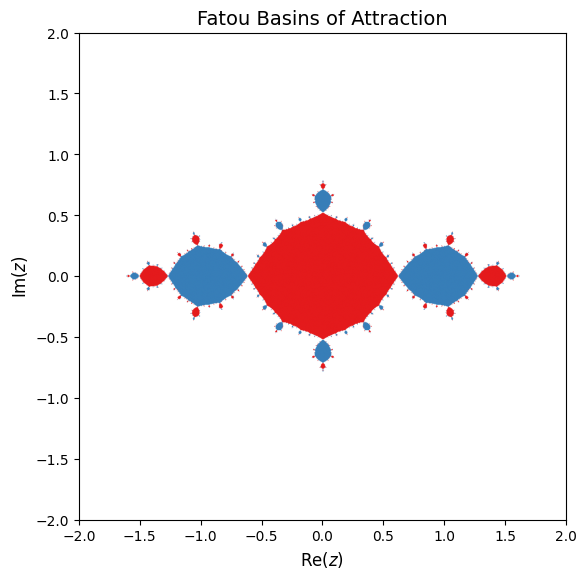

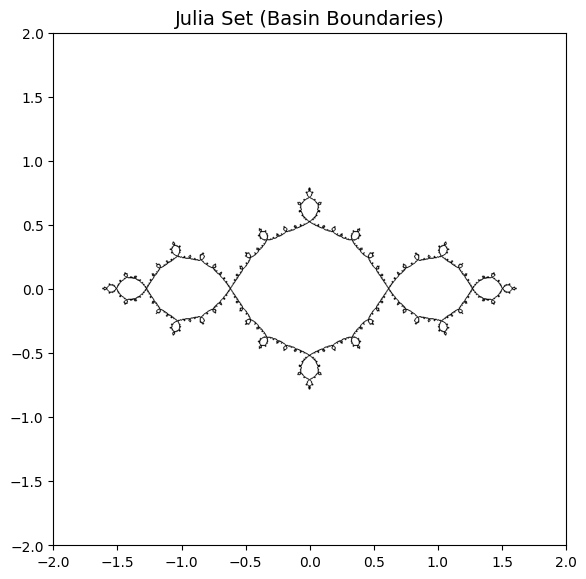

In [19]:
# 3. Plot consistently
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

# Plot 1: The solid colored basins
plotter.plot_fatou_basins(basins)

# Plot 2: Just the Julia set (the delicate boundary curve)
plotter.plot_julia_set_from_basins(basins)

## Optimized, njit

In [20]:
# 1. Define your jitted function
@njit
def R_njit(z):
    return z**2 - 1  # Example rational function

# 2. Create the optimized generator
generate_fatou_basins_jitted = make_generate_fatou_basins_jitted(R_njit)

In [21]:
# 3. Use the created function for generating the Fatou basins (it will compile on the first run, then fly!)
attractors = np.array([0, -1], dtype=np.complex128)
basins = generate_fatou_basins_jitted(-2.0, 2.0, -2.0, 2.0, 1000, 1000, attractors, max_iter=100, tolerance=1e-6)

(<Figure size 600x600 with 1 Axes>,
 <Axes: title={'center': 'Julia Set (Basin Boundaries)'}>)

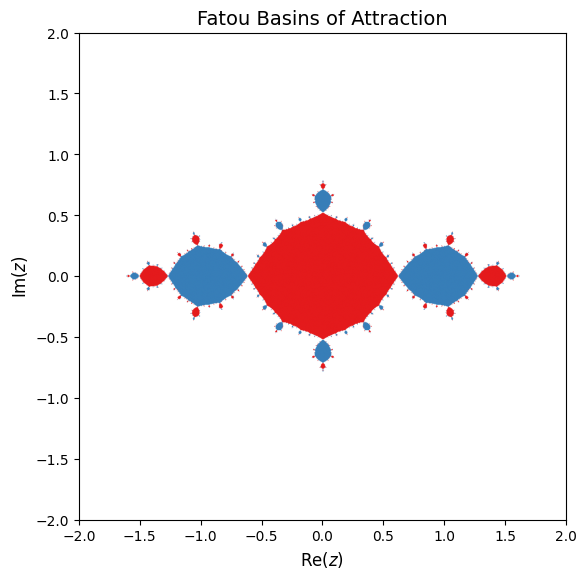

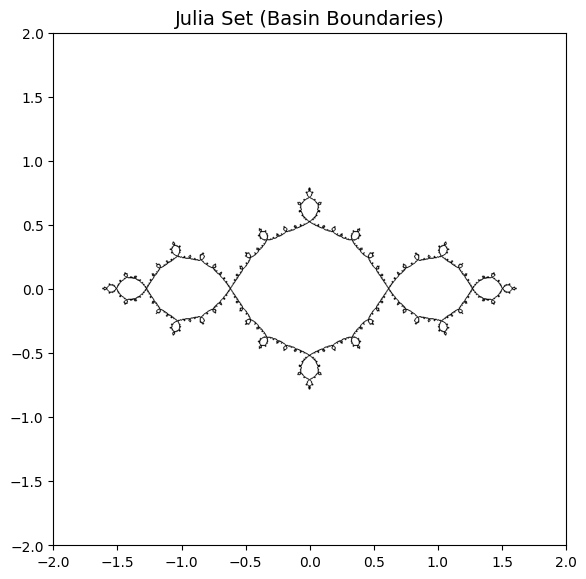

In [22]:
# 4. Plot consistently
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

# Plot 1: The solid colored basins
plotter.plot_fatou_basins(basins)

# Plot 2: Just the Julia set (the delicate boundary curve)
plotter.plot_julia_set_from_basins(basins)

## Plotting options

(<Figure size 1000x1000 with 1 Axes>,
 <Axes: title={'center': 'Julia Set (Basin Boundaries)'}>)

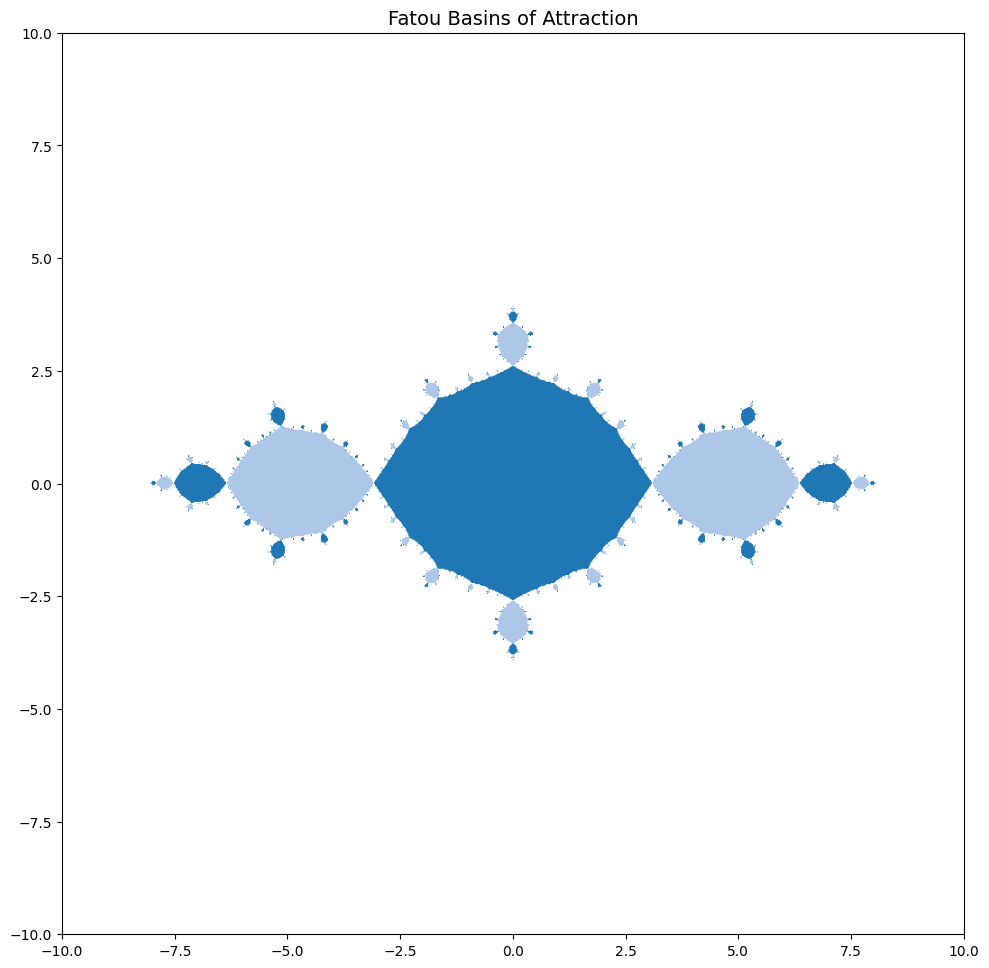

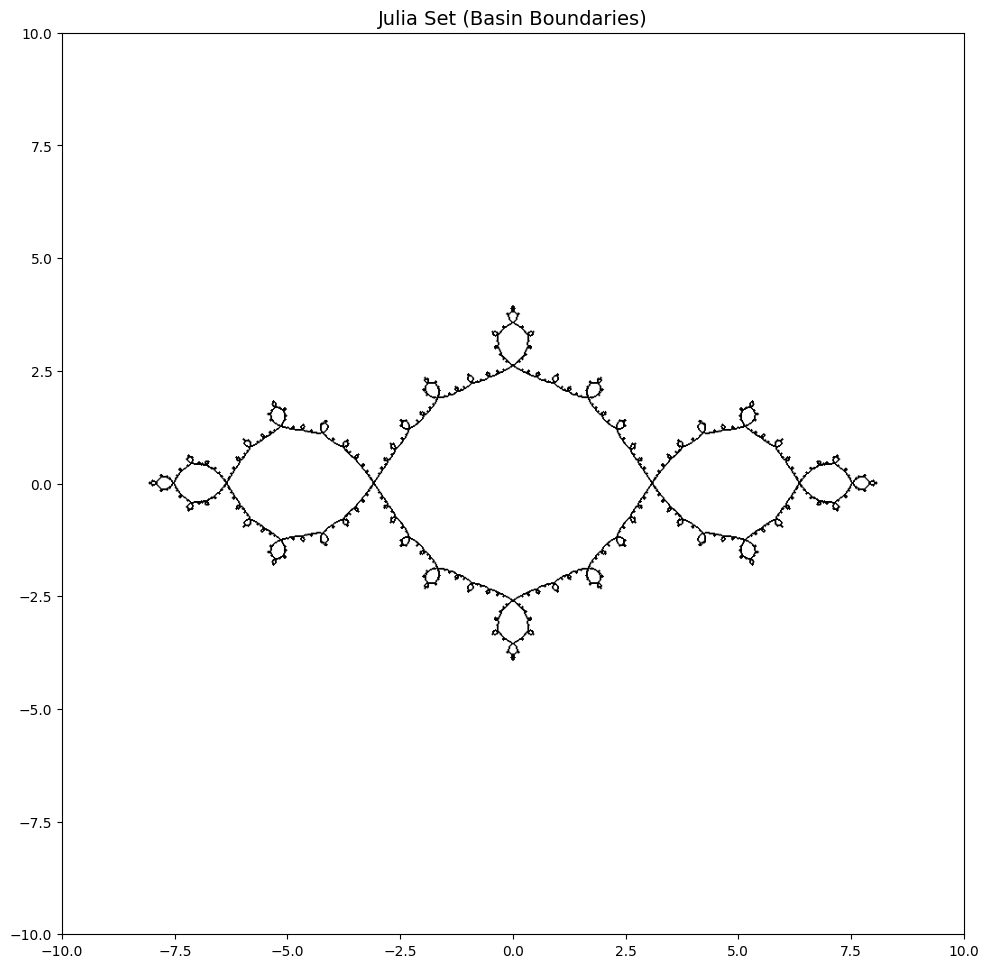

In [23]:
plotter = DynamicsPlotter(-10.0, 10.0, -10.0, 10.0, figsize=(10, 10), use_latex=False)

# Plot 1: The solid colored basins
plotter.plot_fatou_basins(basins, cmap='tab20', title="Fatou Basins of Attraction", show_axis=True, show_axis_labels=False)

# Plot 2: Just the Julia set (the delicate boundary curve)
plotter.plot_julia_set_from_basins(basins, color='black', title="Julia Set (Basin Boundaries)", show_axis=True, show_axis_labels=False)

# Test markers

In [25]:
marker_categories = {
    'Filled': ['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X'],
    'Unfilled/Strokes': ['+', 'x', '|', '_', 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
    'Points/Lines': ['.', ',', 'None', ' ', ''],
}

# Flatten the categories into a single list of marker names
all_markers = [marker for category_list in marker_categories.values() for marker in category_list]

Generating 36 orbit plots. Please wait...


c:\Users\abald\GitHub\Rational-Dynamics-Thesis\code\src\utils.py:76: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=self.figsize)


All plots generated successfully!


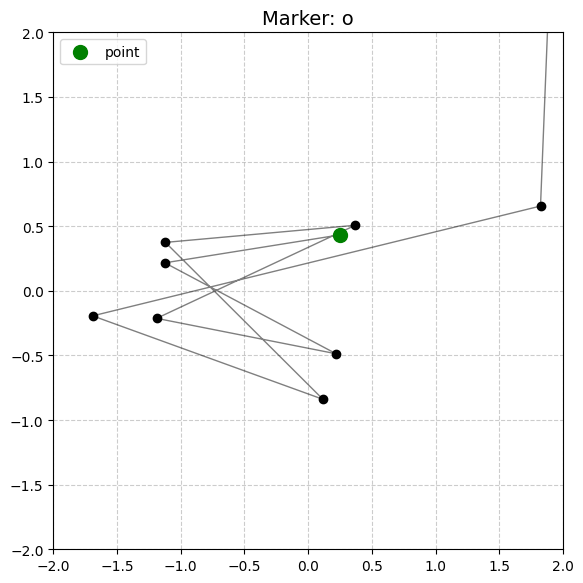

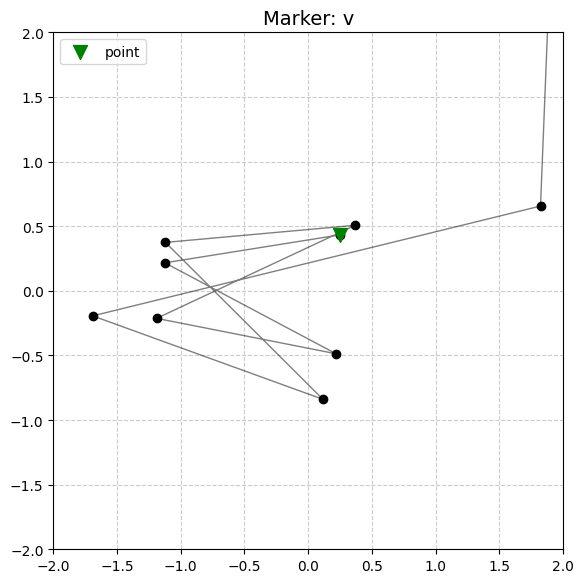

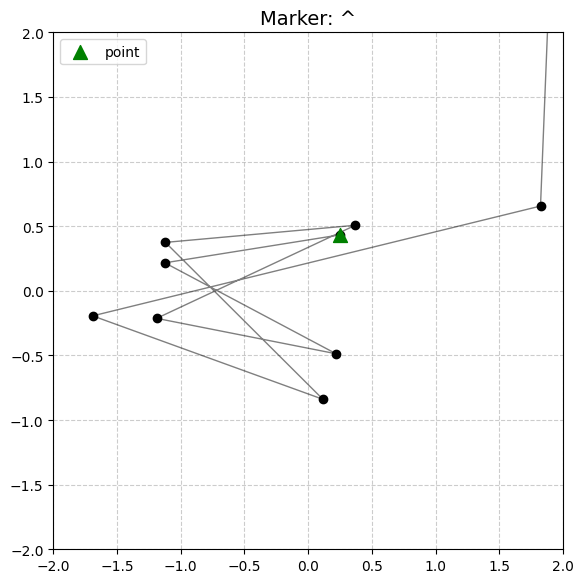

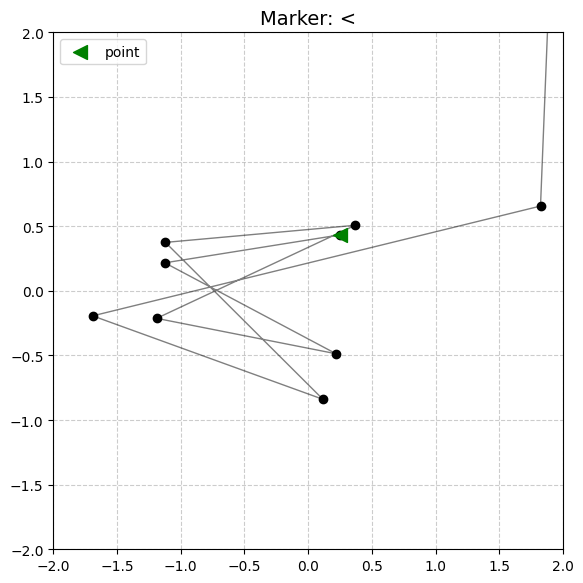

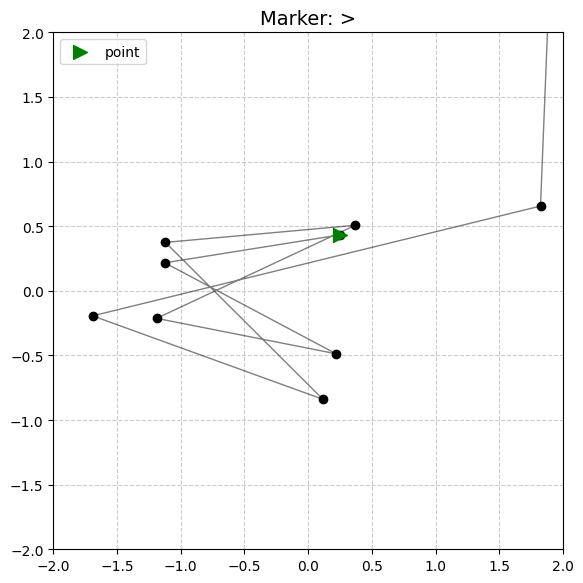

...

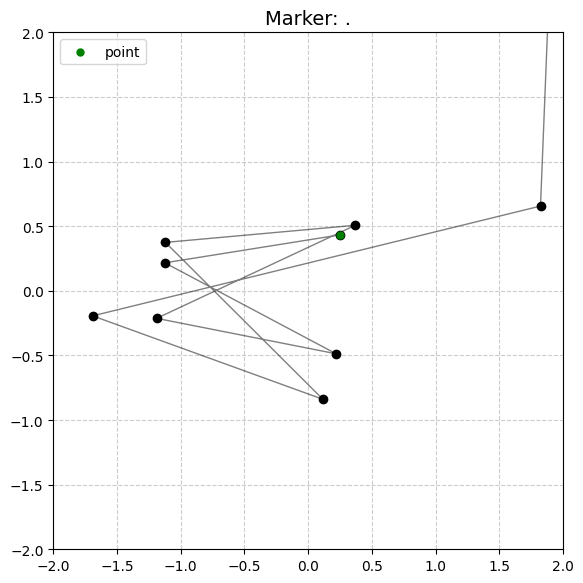

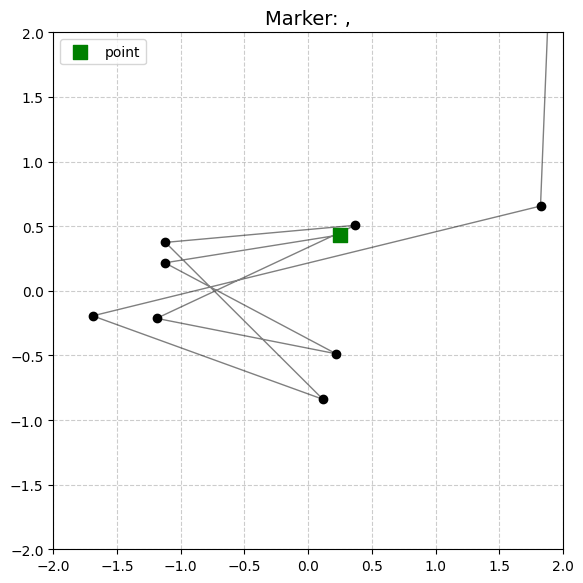

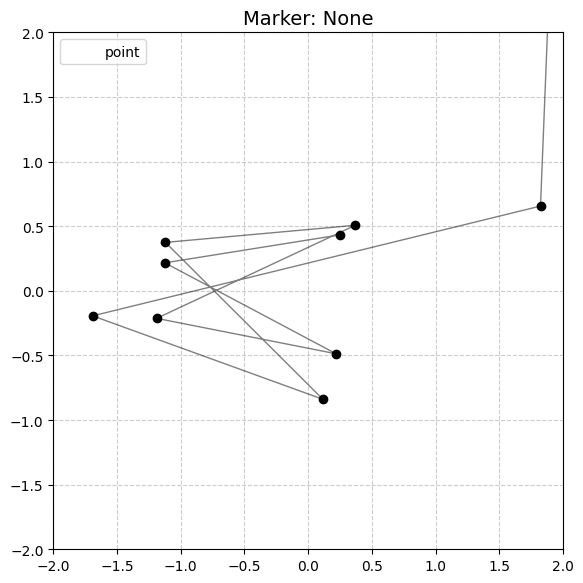

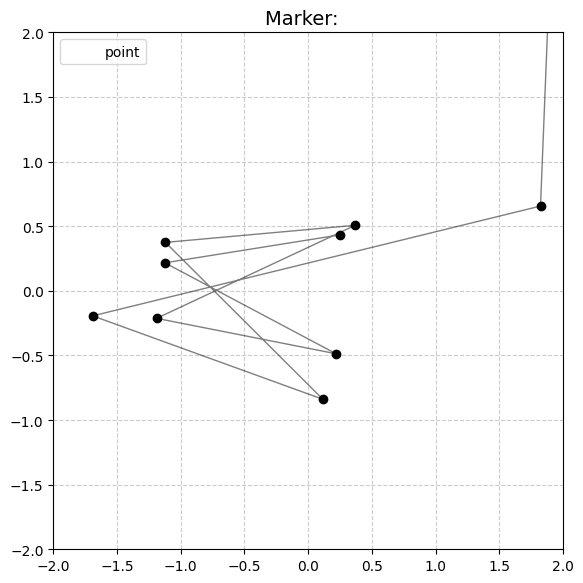

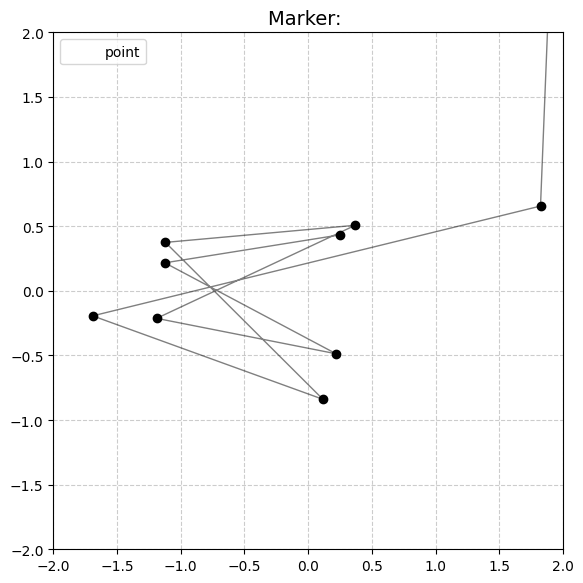

In [26]:
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

print(f"Generating {len(all_markers)} orbit plots. Please wait...")

for marker_name in all_markers:

    fig, ax = plotter.plot_orbit(orbit, connect_lines=True, marker='o', color='black', title=rf"Marker: {marker_name}")
    plotter.add_points(ax, [z0], label="point", marker=marker_name, color='green', s=100, zorder=10)#, **kwargs)
    
print("All plots generated successfully!")

# Test color maps

In [27]:
cmap_categories = {
    'Perceptually Uniform Sequential': ['viridis', 'plasma', 'inferno', 'magma', 'cividis'],
    'Sequential (Single)': ['Greys', 'Purples', 'Blues', 'Greens', 'Oranges', 'Reds'],
    'Sequential (Multi)': ['YlOrBr', 'YlOrRd', 'OrRd', 'PuRd', 'RdPu', 'BuPu', 'GnBu', 'PuBu', 'YlGnBu', 'PuBuGn', 'BuGn', 'YlGn'],
    'Sequential (Other)': ['binary', 'gist_yarg', 'gist_gray', 'gray', 'bone', 'pink', 'spring', 'summer', 'autumn', 'winter', 'cool', 'Wistia', 'hot', 'afmhot', 'gist_heat', 'copper'],
    'Diverging': ['PiYG', 'PRGn', 'BrBG', 'PuOr', 'RdGy', 'RdBu', 'RdYlBu', 'RdYlGn', 'Spectral', 'coolwarm', 'bwr', 'seismic'],
    'Qualitative': ['Pastel1', 'Pastel2', 'Paired', 'Accent', 'Dark2', 'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b', 'tab20c'],
    'Cyclic': ['twilight', 'twilight_shifted', 'hsv'],
    'Miscellaneous': ['flag', 'prism', 'ocean', 'gist_earth', 'terrain', 'gist_stern', 'gnuplot', 'gnuplot2', 'CMRmap', 'cubehelix', 'brg', 'gist_rainbow', 'rainbow', 'jet', 'turbo', 'nipy_spectral', 'gist_ncar']
}

# Flatten the categories into a single list of colormap names
all_cmaps = [cmap for category_list in cmap_categories.values() for cmap in category_list]

## Escape time fractal

Generating 83 escape time fractal plots. Please wait...
All plots generated successfully!


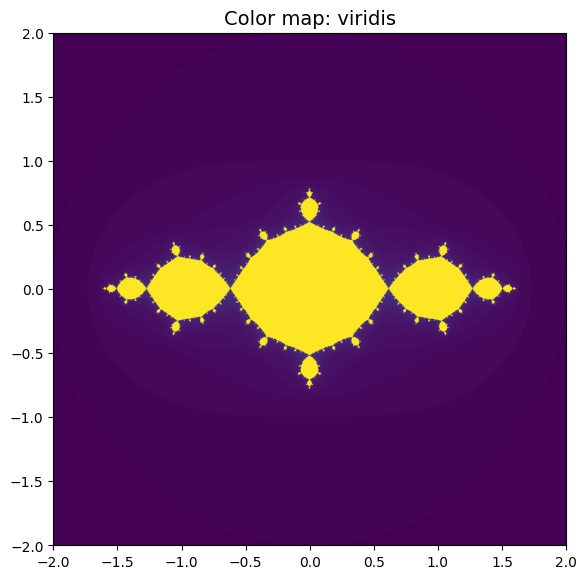

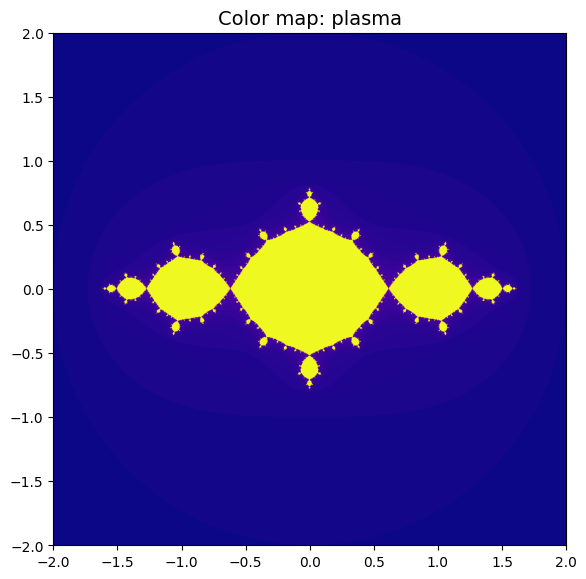

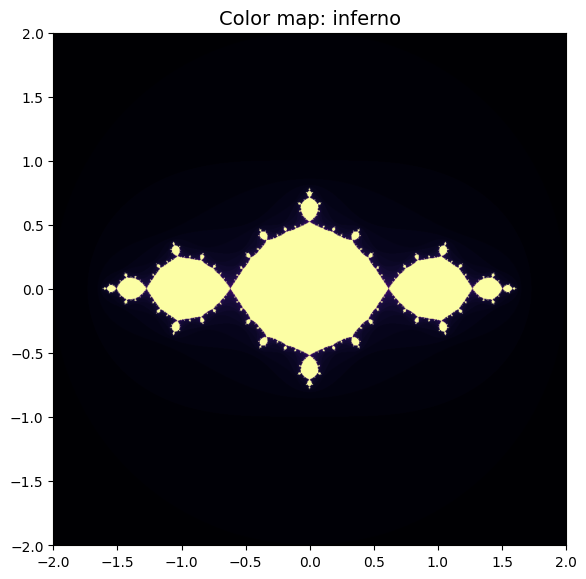

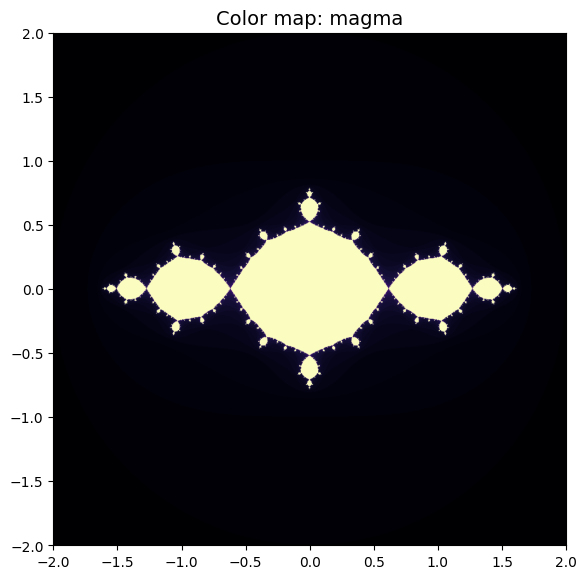

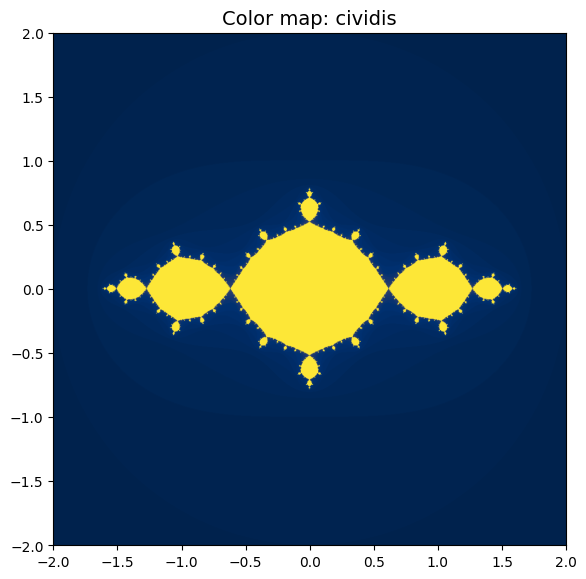

...

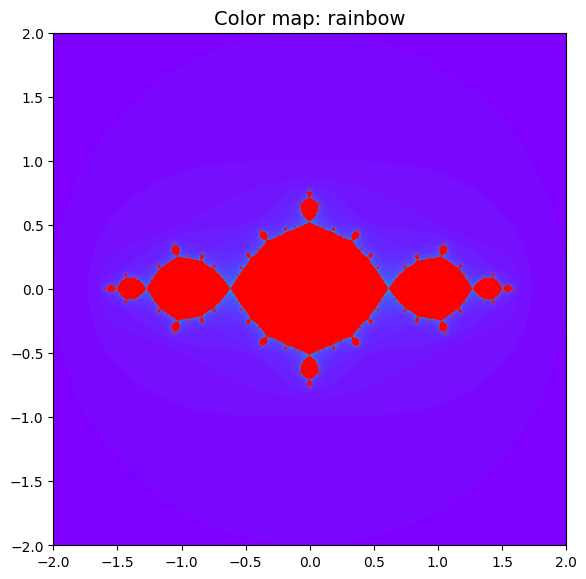

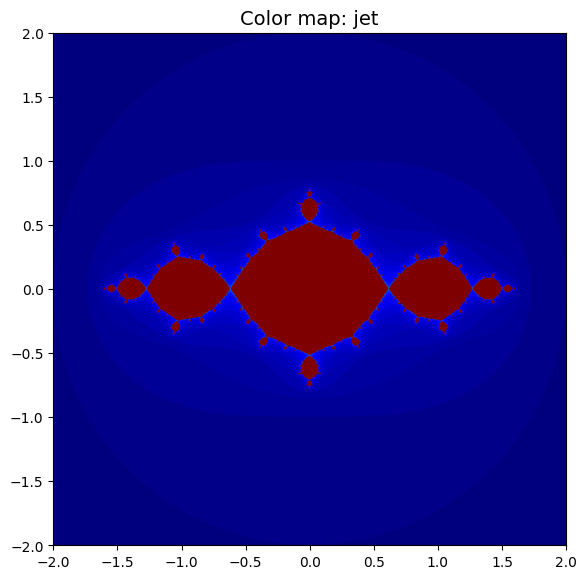

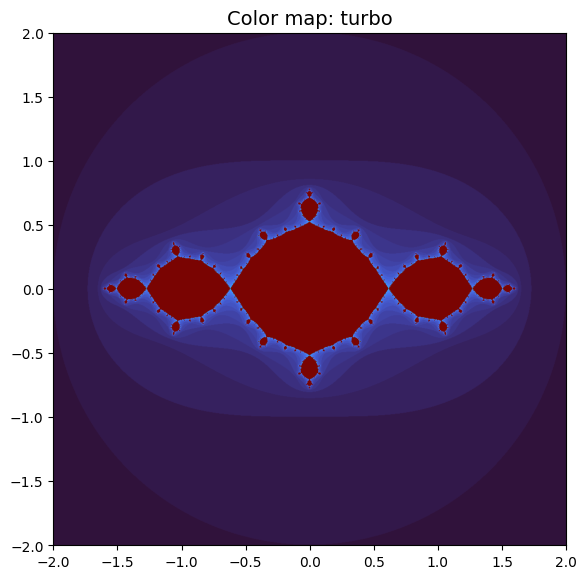

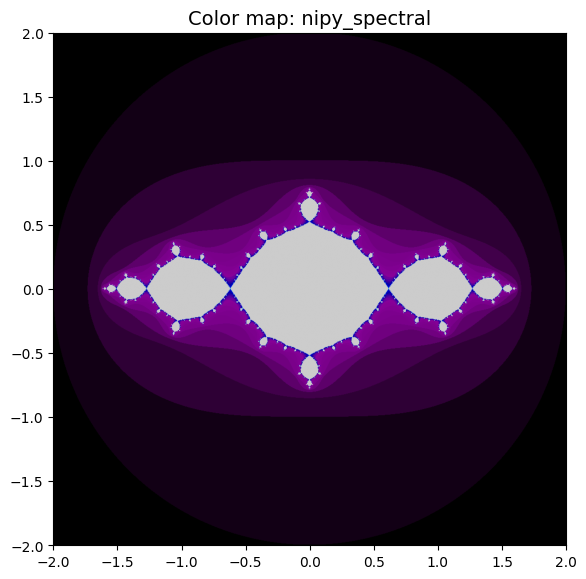

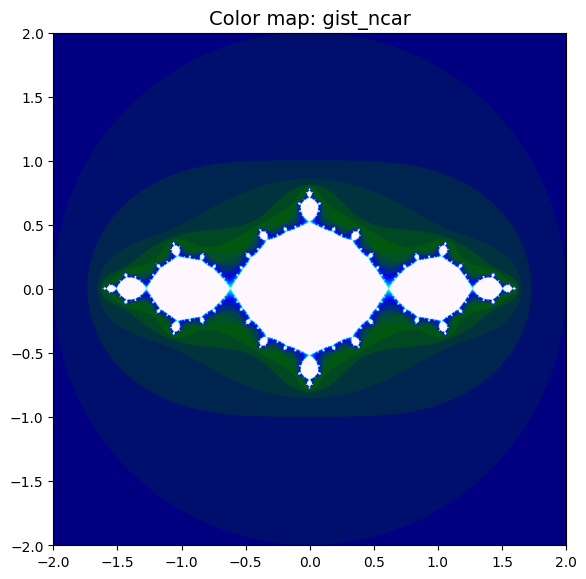

In [ ]:
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

print(f"Generating {len(all_cmaps)} escape time fractal plots. Please wait...")

for cmap_name in all_cmaps:

    plotter.plot_escape_time_fractal(escape_times, cmap=cmap_name, title=rf"Color map: {cmap_name}")
    plotter.plot_escape_time_fractal(escape_times, cmap=rf"{cmap_name}_r", title=rf"Color map: {cmap_name}_r")
    
    
print("All plots generated successfully!")

## Fatou Basins

Generating 83 fatou basin plots. Please wait...
All plots generated successfully!


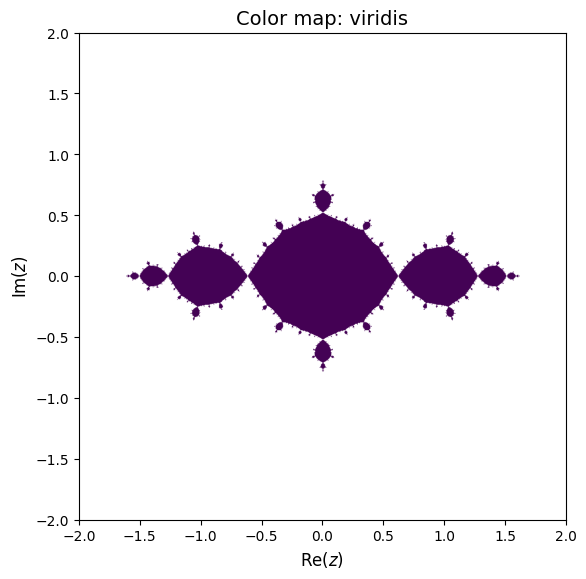

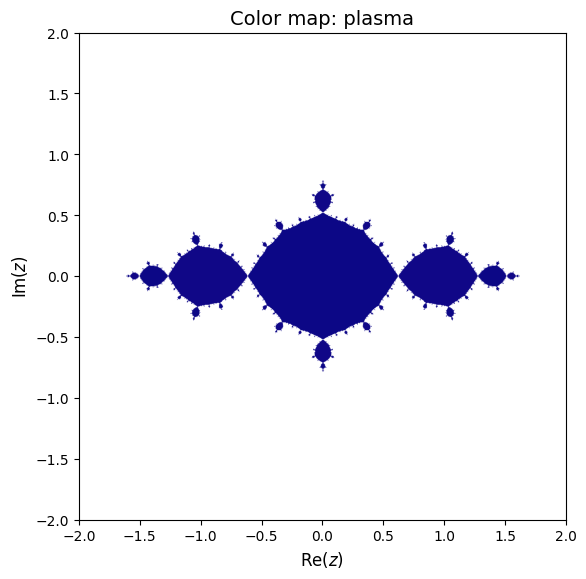

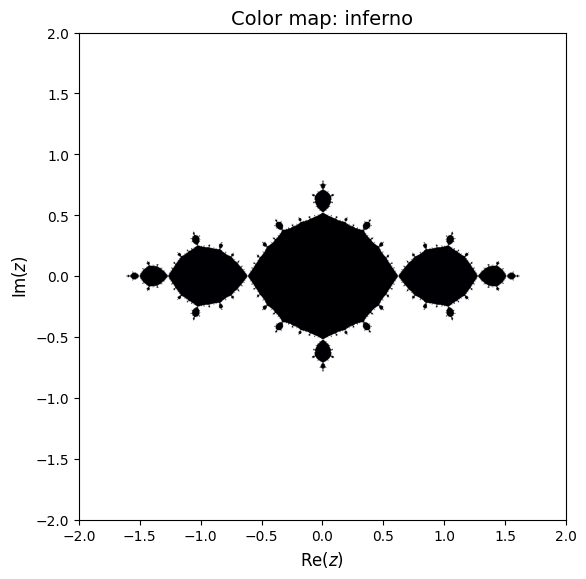

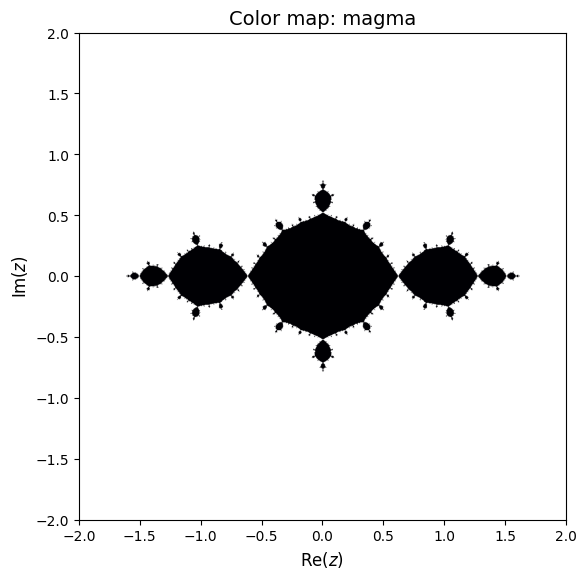

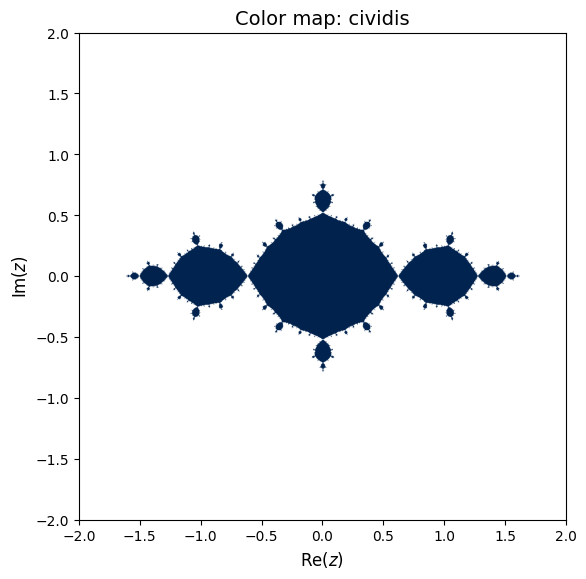

...

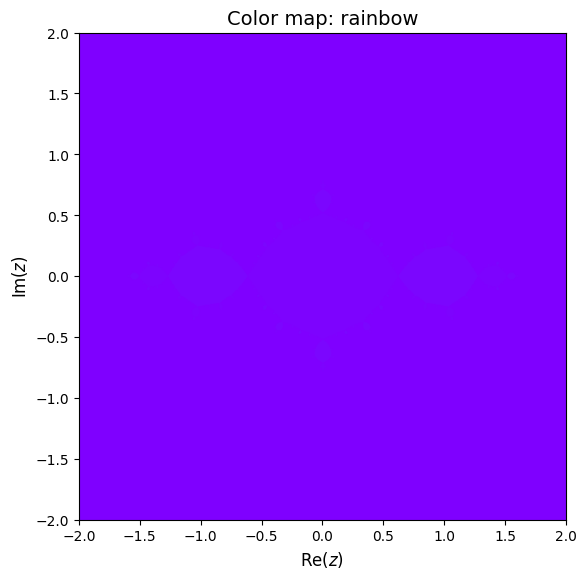

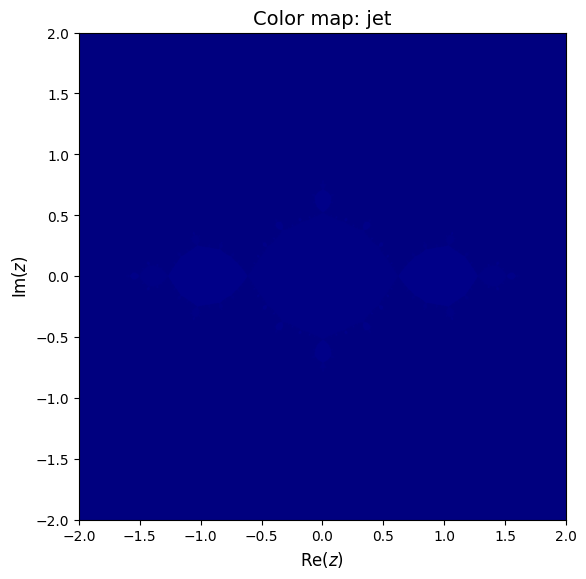

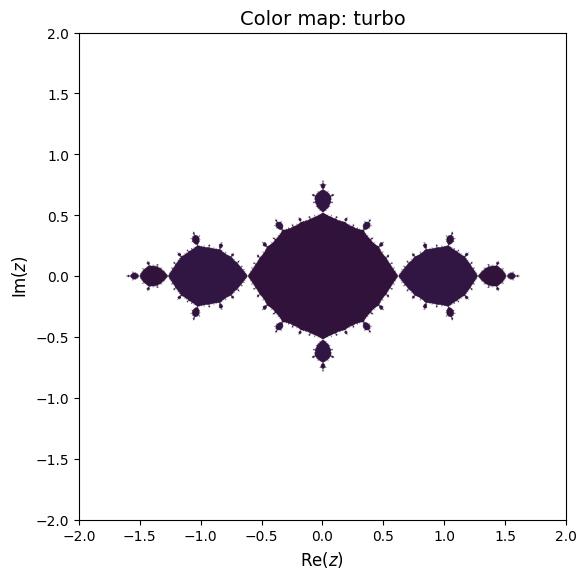

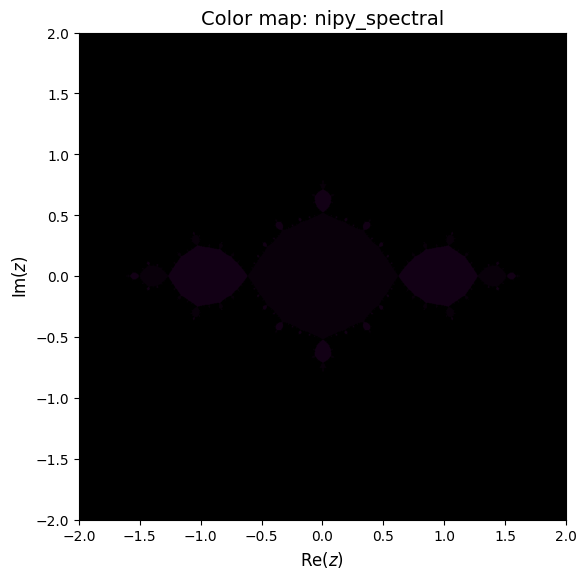

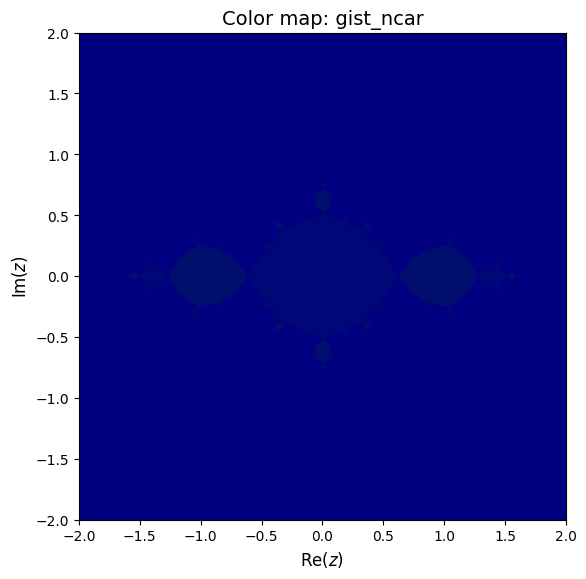

In [30]:
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

print(f"Generating {len(all_cmaps)} fatou basin plots. Please wait...")

for cmap_name in all_cmaps:

    plotter.plot_fatou_basins(basins, cmap=cmap_name, title=rf"Color map: {cmap_name}")
    
print("All plots generated successfully!")

# Other examples

## Douady Rabbit parameter for $z^2 + c$

In [31]:
# 1. Define your jitted function
# We'll use the Douady Rabbit parameter: c = -0.12256117 + 0.74486177j
@njit
def R_njit(z):
    return z**2 - 0.12256117 + 0.74486177j

# 2. Create the optimized generator
generate_escape_time_fractal_jitted = make_generate_escape_time_fractal_jitted(R_njit)

In [ ]:
# 3. Use the created function for generating the Fatou basins (it will compile on the first run, then fly!)
escape_times = generate_escape_time_fractal_jitted(-1.5, 1.5, -1.5, 1.5, 1000, 1000, max_iter=100, infinity_threshold=2.0)

(<Figure size 600x600 with 1 Axes>,
 <Axes: title={'center': 'Julia Set (Escape Boundary)'}>)

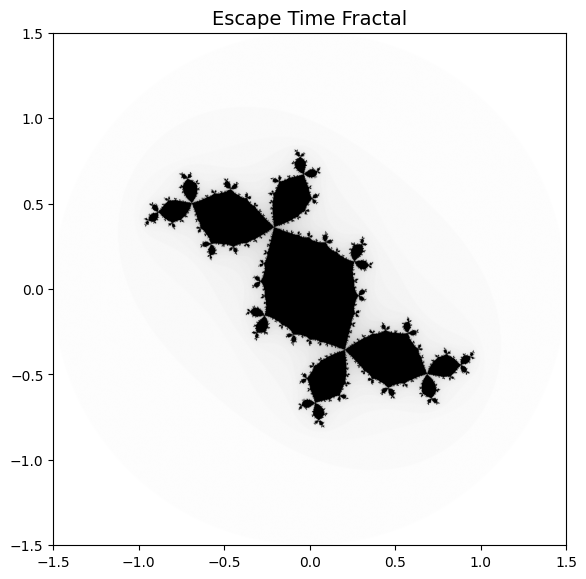

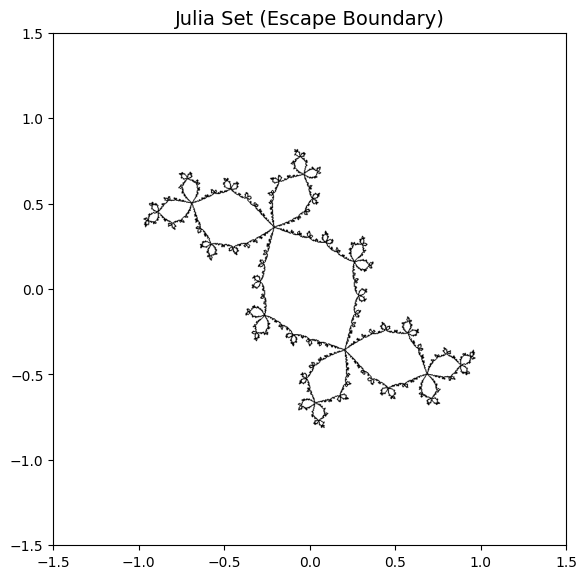

In [33]:
# 4. Plot consistently
plotter = DynamicsPlotter(-1.5, 1.5, -1.5, 1.5)

# Plot 1: The escape time fractal
plotter.plot_escape_time_fractal(escape_times)

# Plot 2: Just the Julia set (the delicate boundary curve)
plotter.plot_julia_set_from_escape_times(escape_times, max_iter=100)

## Newton Fractal

In [24]:
# 1. Define your jitted function
@njit
# We'll use Newton's method applied to p(z) = z^3 - 1
# N(z) = z - p(z)/p'(z) = z - (z^3 - 1)/(3z^2) = (2z^3 + 1) / (3z^2)
def R_njit(z):
    # We add a tiny epsilon to the denominator to avoid strict ZeroDivisionError
    return (2*z**3 + 1) / (3*z**2 + 1e-15)

# 2. Create the optimized generator
generate_fatou_basins_jitted = make_generate_fatou_basins_jitted(R_njit)

In [25]:
# 3. Use the created function for generating the Fatou basins (it will compile on the first run, then fly!)
attractors = np.array(
    [
        1.0 + 0.0j,
        -0.5 + 0.8660254j,
        -0.5 - 0.8660254j
    ],
    dtype=np.complex128)
basins = generate_fatou_basins_jitted(-2.0, 2.0, -2.0, 2.0, 1000, 1000, attractors, max_iter=100, tolerance=1e-6)

Saved figure to: ../../figures/z_cubed_minus_one_newton_fatou_basins-large.pdf


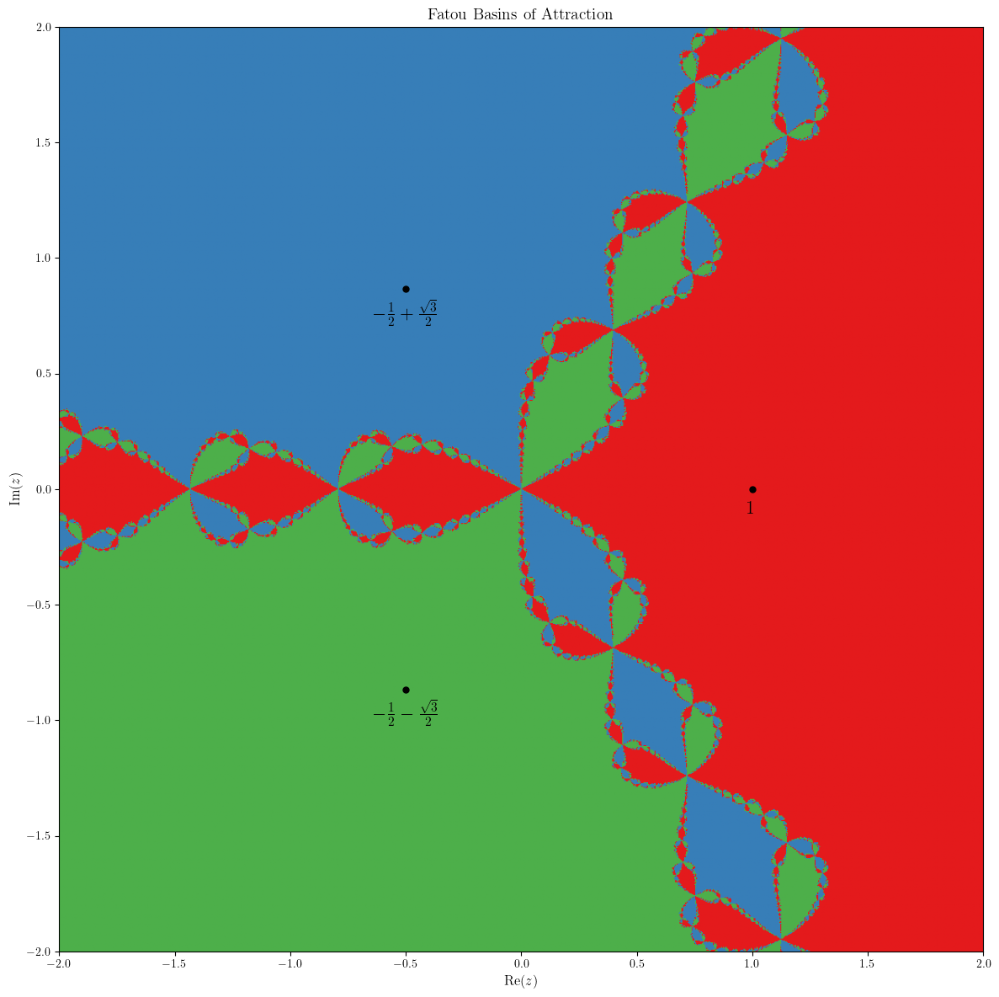

In [26]:
# 4. Plot consistently
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0, figsize=(12,12), use_latex=True)

# Plot 1: The solid colored basins
fig, ax = plotter.plot_fatou_basins(basins)
plotter.add_points(ax, [attractors[0]], label="$1$", marker='.', color='black', s=100)
plotter.add_points(ax, [attractors[1]], label="$-\\frac{1}{2} + \\frac{\sqrt{3}}{2}$", marker='.', color='black', s=100)
plotter.add_points(ax, [attractors[2]], label="$-\\frac{1}{2} - \\frac{\sqrt{3}}{2}$", marker='.', color='black', s=100)

Saved figure to: ../../figures/z_cubed_minus_one_newton_julia_set-large.pdf


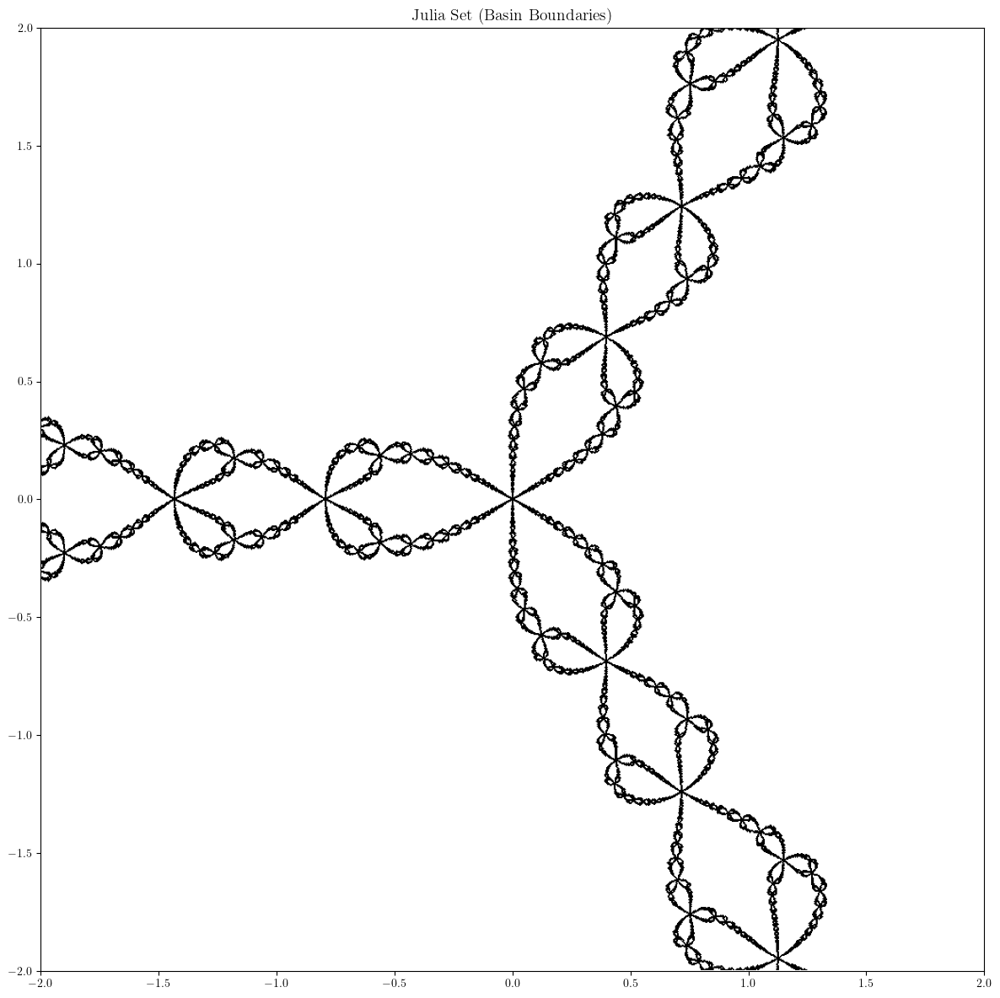

In [27]:
# Plot 2: Just the Julia set (the delicate boundary curve)
fig, ax = plotter.plot_julia_set_from_basins(basins)

## Another parameter for $z^2 + c$

In [28]:
# 1. Define your jitted function
@njit
def R_njit(z):
    return z**2 - 0.4 + 0.6j

# 2. Create the optimized generator
generate_escape_time_fractal_jitted = make_generate_escape_time_fractal_jitted(R_njit)

In [29]:
# 3. Use the created function for generating the Fatou basins (it will compile on the first run, then fly!)
escape_times = generate_escape_time_fractal_jitted(-2.0, 2.0, -2.0, 2.0, 10000, 10000, max_iter=100, infinity_threshold=2.0)

(<Figure size 600x600 with 1 Axes>,
 <Axes: title={'center': 'Julia Set (Escape Boundary)'}>)

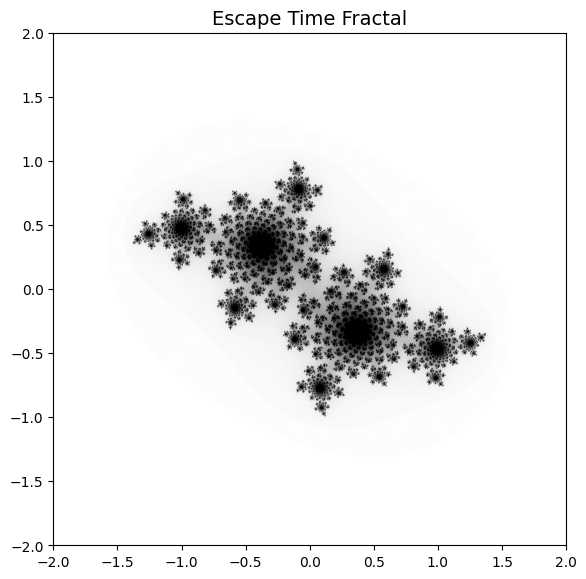

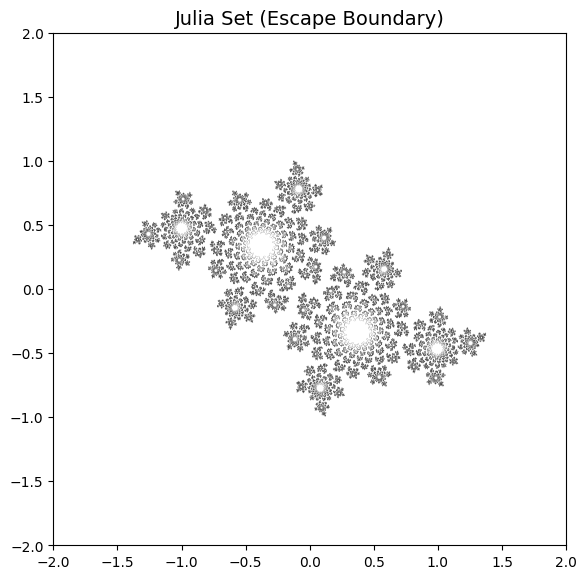

In [30]:
# 4. Plot consistently
plotter = DynamicsPlotter(-2.0, 2.0, -2.0, 2.0)

# Plot 1: The escape time fractal
plotter.plot_escape_time_fractal(escape_times)

# Plot 2: Just the Julia set (the delicate boundary curve)
plotter.plot_julia_set_from_escape_times(escape_times, max_iter=100)